### Урок 1. Обработка изображений и компьютерное зрение
#### Домашнее задание
Напишите на Python реализацию как минимум одного алгоритма на выбор: любая на выбор цветовая обработка, перевод в другое цветовое пространство или фильтрация. Изображение выберите самостоятельно.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

import imageio

In [2]:
img = imageio.imread('/content/IMG_2670_jpg.JPG')

<ipython-input-2-8312c61cc4aa>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread('/content/IMG_2670_jpg.JPG')


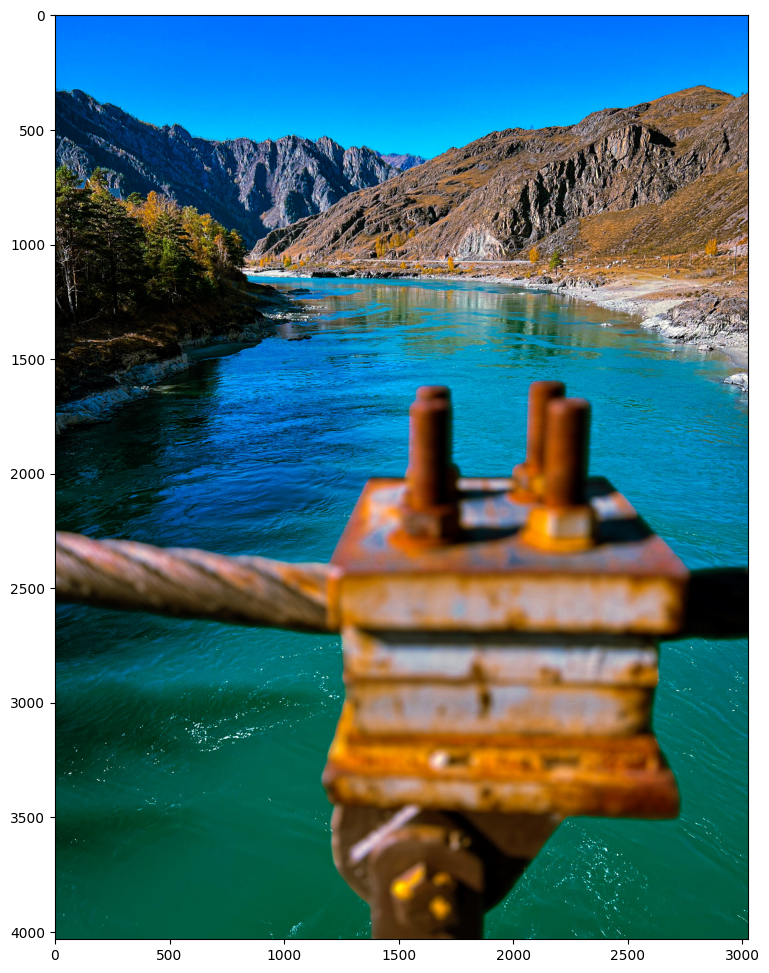

In [3]:
plt.figure(figsize=(12, 12))
plt.imshow(img)

In [4]:
img.shape

(4032, 3024, 3)

#### Нелинейное уменьшение яркости

In [5]:
img = img.astype(np.float32) / 255.

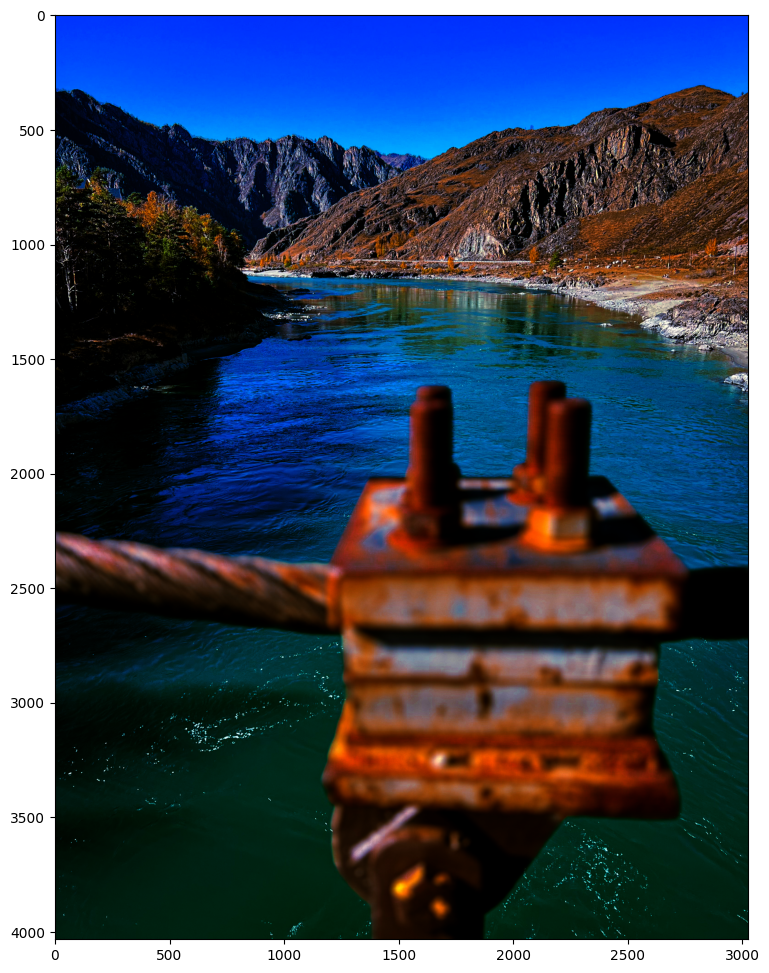

In [6]:
plt.figure(figsize=(12, 12))
plt.imshow(img**2)

#### Изменение яркости каналов

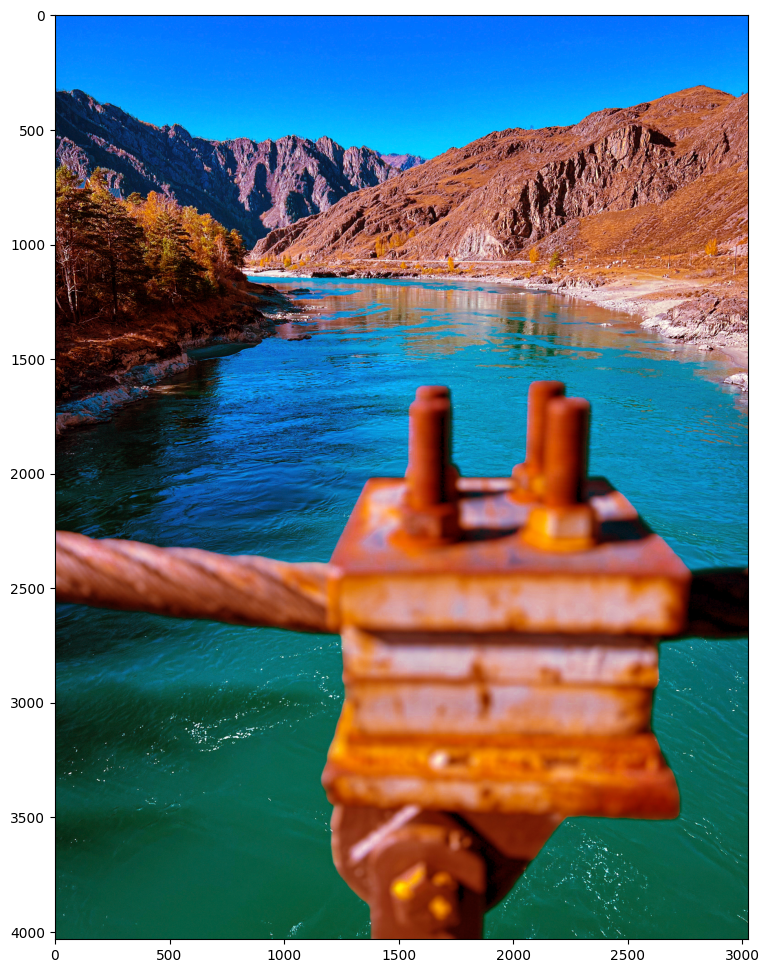

In [7]:
img_copy = np.copy(img)
img_copy[:, :, 0] = np.sqrt(img_copy[:, :, 0])
plt.figure(figsize=(12, 12))
plt.imshow(img_copy)

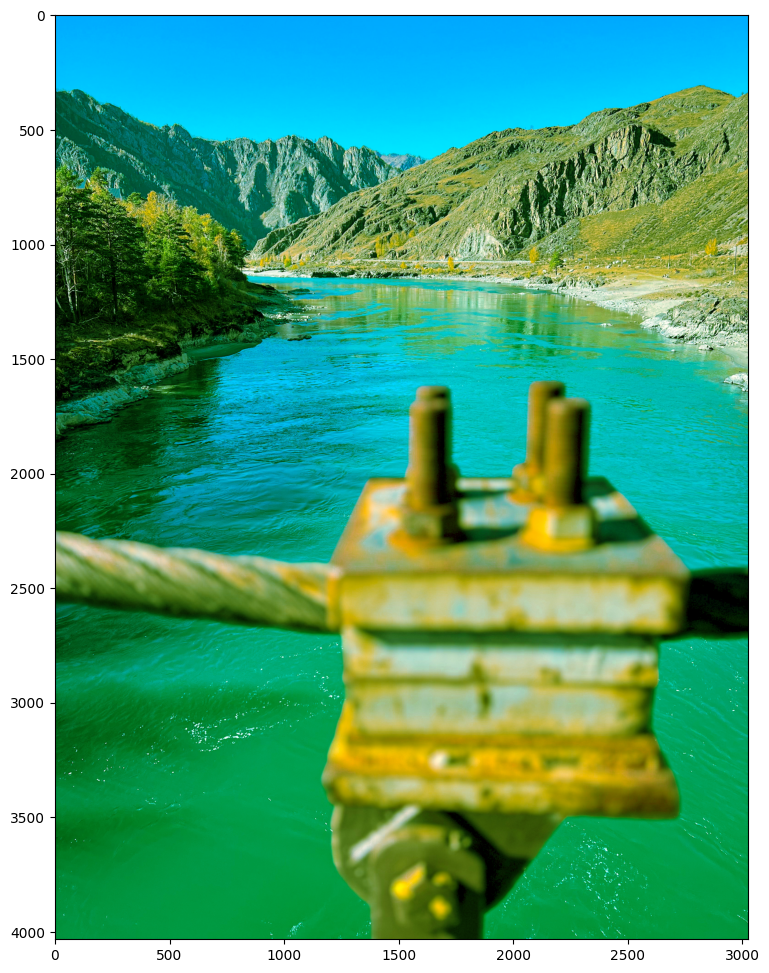

In [8]:
img_copy = np.copy(img)
img_copy[:, :, 1] = np.sqrt(img_copy[:, :, 1])
plt.figure(figsize=(12, 12))
plt.imshow(img_copy)

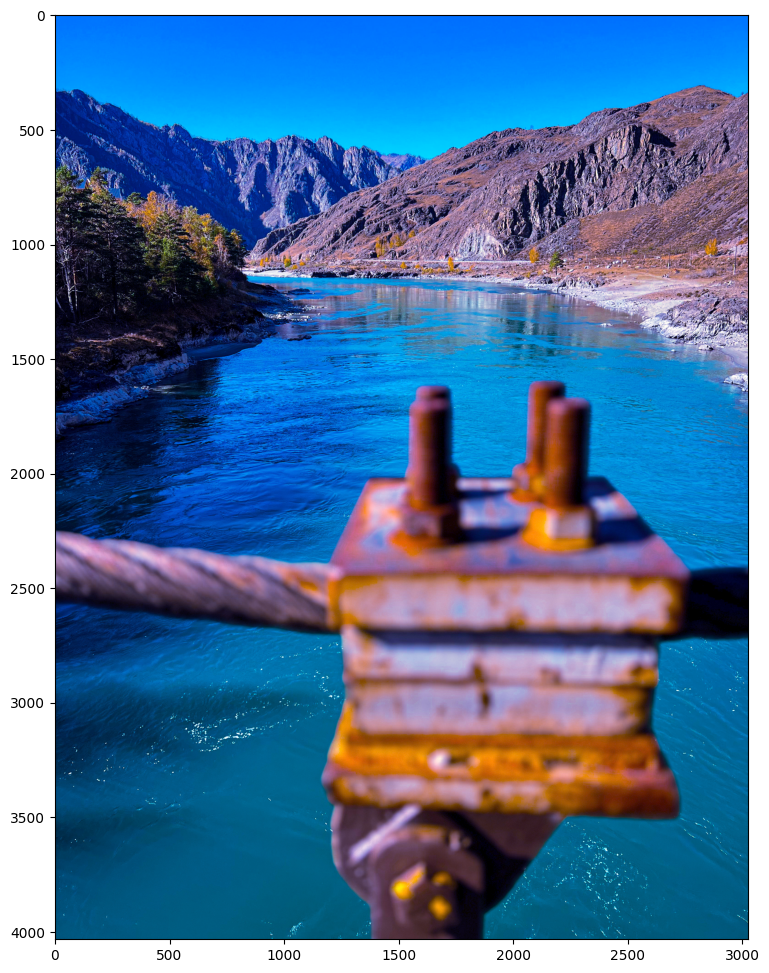

In [9]:
img_copy = np.copy(img)
img_copy[:, :, 2] = np.sqrt(img_copy[:, :, 2])
plt.figure(figsize=(12, 12))
plt.imshow(img_copy)

#### Цветовая обработка: Бинаризация

In [10]:
threshold = 0.5
img_bw = np.mean(img, axis=2)
img_bin = (img_bw > threshold).astype(np.uint8)

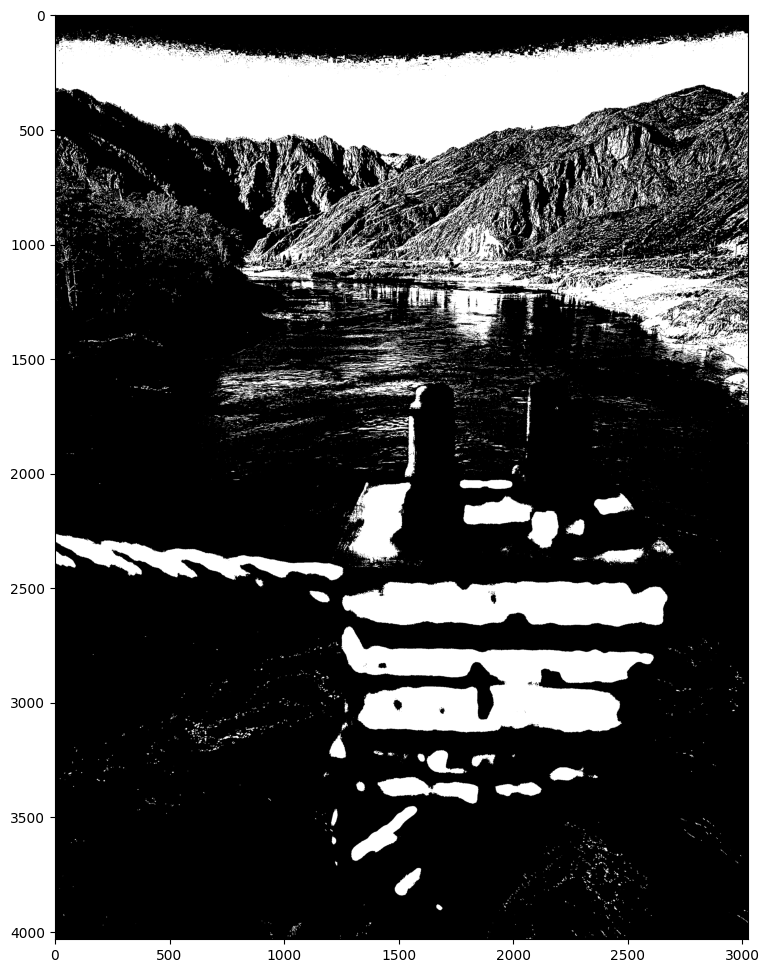

In [11]:
plt.figure(figsize=(12, 12))
plt.imshow(img_bin*255, cmap='gray')

#### Перевод в другое цветовое пространство

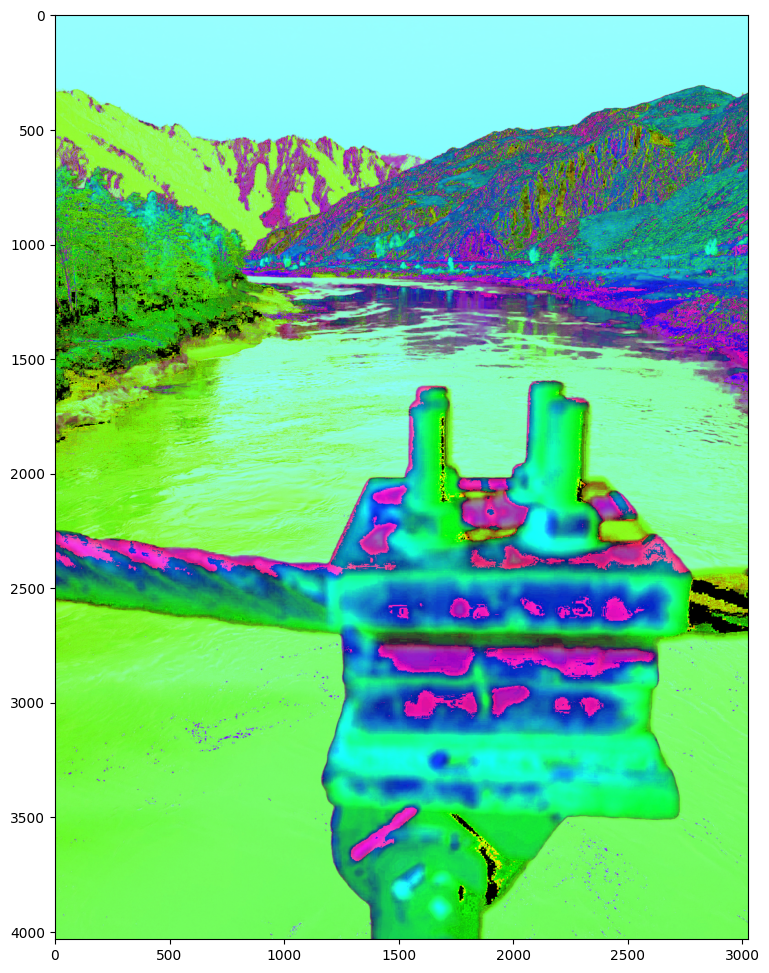

In [12]:
from skimage.color import rgb2hsv, hsv2rgb
img_hsv = rgb2hsv(img)
plt.figure(figsize=(12, 12))
plt.imshow(img_hsv)

In [13]:
print(img_hsv[:100, :100, :])

[[[0.5901961  1.         1.        ]
  [0.5901961  1.         1.        ]
  [0.5901961  1.         1.        ]
  ...
  [0.58959156 1.         0.99215686]
  [0.58959156 1.         0.99215686]
  [0.5892388  1.         0.99607843]]

 [[0.5901961  1.         1.        ]
  [0.5901961  1.         1.        ]
  [0.5901961  1.         1.        ]
  ...
  [0.5892388  1.         0.99607843]
  [0.5892388  1.         0.99607843]
  [0.5892388  1.         0.99607843]]

 [[0.5901961  1.         1.        ]
  [0.5901961  1.         1.        ]
  [0.5901961  1.         1.        ]
  ...
  [0.5888889  1.         1.        ]
  [0.589895   0.99607843 1.        ]
  [0.5901961  1.         1.        ]]

 ...

 [[0.5872703  1.         0.99607843]
  [0.5872703  1.         0.99607843]
  [0.58692807 1.         1.        ]
  ...
  [0.58498025 1.         0.99215686]
  [0.5846457  1.         0.99607843]
  [0.5846457  0.99607843 1.        ]]

 [[0.5866142  0.99607843 1.        ]
  [0.5866142  0.99607843 1.        ]


#### Фильтрация

In [14]:
from scipy import stats

In [15]:
def apply_filter(img, kernel):
    out_img = np.zeros(
      (img.shape[0] - kernel.shape[0] + 1,
       img.shape[1] - kernel.shape[1] + 1),
       dtype=np.float32)

    for i in range(out_img.shape[0]):
        for j in range(out_img.shape[1]):
            try:
                x = img[i:i + kernel.shape[0], j:j + kernel.shape[1]]
                out_img[i, j] =  np.sum(x*kernel)
            except Exception as e:
                #print(e)
                pass

    out_img = out_img/np.sum(out_img)

    return out_img

In [16]:
def gaussian_kernel(kernel_size=7, n_sigma=1):
    x = np.linspace(-n_sigma, n_sigma, kernel_size+1)
    kern1d = np.diff(stats.norm.cdf(x))
    kern2d = np.outer(kern1d, kern1d)
    return kern2d/kern2d.sum()

In [17]:
def gaussian_blur(img, window_size, n_sigma):
    kernel = gaussian_kernel(window_size, n_sigma)
    out_img = apply_filter(img, kernel)
    return out_img

In [18]:
def vertical_boundaries(img):
    kernel = np.zeros((3, 3))
    kernel[:, 2] = 1
    kernel[:, 0] = -1
    out_img = apply_filter(img, kernel)
    return out_img

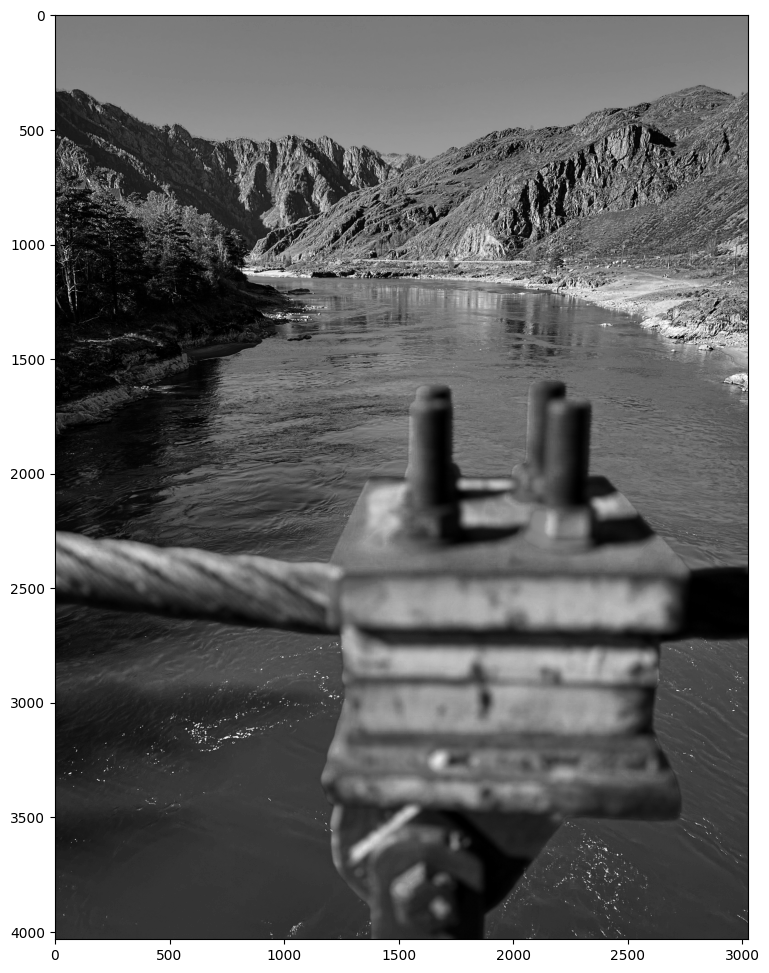

In [19]:
plt.figure(figsize=(12, 12))
plt.imshow(img_bw, cmap='gray')

CPU times: user 1min 49s, sys: 291 ms, total: 1min 49s
Wall time: 1min 52s


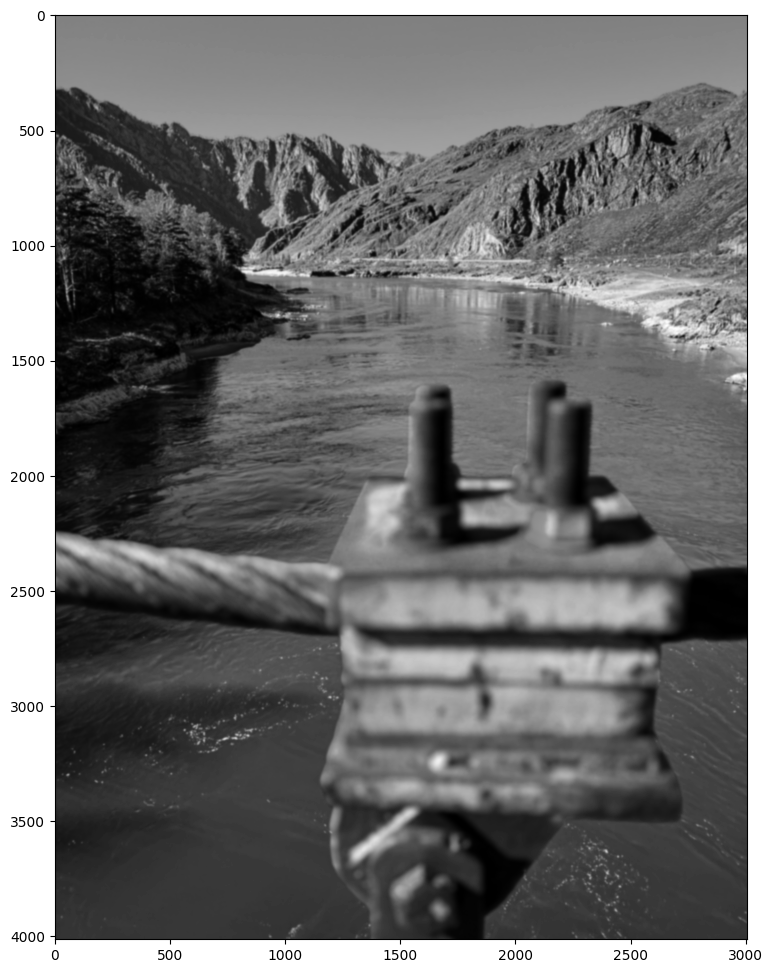

In [20]:
%%time
plt.figure(figsize=(12, 12))
plt.imshow(gaussian_blur(img_bw, 20, 3), cmap='gray')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs


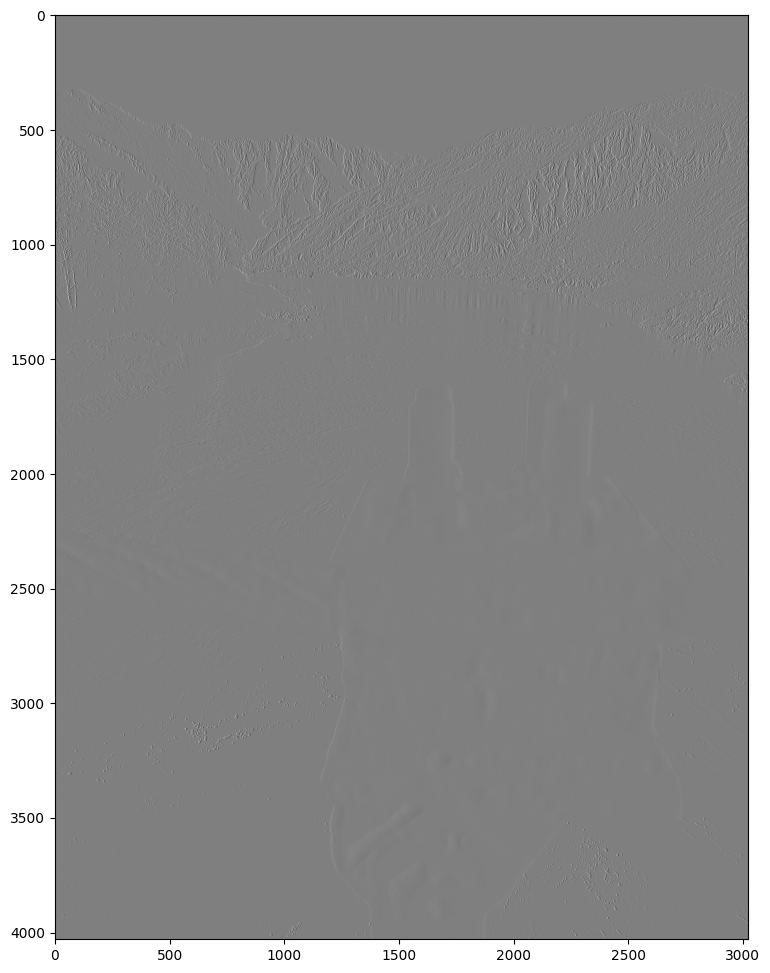

In [21]:
%time
plt.figure(figsize=(12, 12))
plt.imshow(vertical_boundaries(img_bw), cmap='gray')